# **2026 World University Rankings - Exploring relationships**

### Exercise 6.2

## Contents: 
#### 1. Importing libraries and data
#### 2. Exploring Relationships
#####   Correlations
######       Heatmaps
######       Scatterplots
######       Pair Plots
######       Categorical Plots
#### 3. Answering Questions
#### 4. Adding Questions
#### 5. Hypotheses


## 1. Importing libraries and data

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib
import os

In [2]:
path = r'C:\Users\lisad\OneDrive\Homework\Data Immersion\Achievement 6\University Rankings Project'

In [3]:
df = pd.read_excel(os.path.join(path, 'Data', 'Rankings2026_cleaned.xlsx'))

In [4]:
# Checking matplotlib version
matplotlib.__version__

'3.10.5'

## 2. Exploring Relationships

### Correlations:

In [5]:
# Creating a correlation matrix using pandas (for experience)
# Extracting numeric values in '2026 Rank' and 'Previous Rank' columns under the guidance of Anaconda Assistant

# Modified lambda function to handle ranges, single values, and integers
def extract_midpoint(x):
    if isinstance(x, (int, float)):  # Check if the value is already a number
        return float(x)
    try:
        # Try to convert directly to float first
        return float(x)
    except (ValueError, TypeError):
        try:
            parts = x.split('-')
            if len(parts) == 2:  # Range like '10-20'
                return (float(parts[0]) + float(parts[1])) / 2
            elif len(parts) == 1:  # Single value like '10'
                return float(parts[0])
            else:
                return np.nan
        except (AttributeError, ValueError, TypeError):
            return np.nan

# Apply the function to both columns
df['rank_range_midpoint'] = df['2026 Rank'].apply(extract_midpoint)
df['prevrank_range_midpoint'] = df['Previous Rank'].apply(extract_midpoint)

# Create correlation matrix
correlation = df.select_dtypes(include=['number']).corr()

# Displaying the correlation matrix
correlation

,Unnamed: 0,Academic_Reputation_Score,Employer_Reputation_Score,Faculty_Student_Ratio_Score,Citations_Per_Faculty_Score,International_Faculty_Ratio_Score,International_Student_Ratio_Score,International_Student_Diversity_Score,International_Research_Network_Score,Employment_Outcomes_Score,Sustainability_Score,Overall SCORE,rank_range_midpoint,prevrank_range_midpoint
Unnamed: 0,1.000000,-0.778469,-0.730453,-0.349413,-0.692053,-0.561501,-0.513292,-0.518607,-0.696834,-0.603816,-0.792013,-0.949344,0.996912,0.980949
Academic_Reputation_Score,-0.778469,1.000000,0.859036,0.295862,0.483853,0.391050,0.372722,0.367540,0.585594,0.685222,0.714574,0.904785,-0.786611,-0.785449
Employer_Reputation_Score,-0.730453,0.859036,1.000000,0.288041,0.396688,0.338012,0.342748,0.345004,0.419266,0.662357,0.603636,0.785393,-0.730922,-0.717442
Faculty_Student_Ratio_Score,-0.349413,0.295862,0.288041,1.000000,0.032861,0.157783,0.225548,0.220944,0.060275,0.187036,0.154962,0.314677,-0.307741,-0.356135
Citations_Per_Faculty_Score,-0.692053,0.483853,0.396688,0.032861,1.000000,0.385040,0.313148,0.302079,0.546153,0.307799,0.553579,0.495439,-0.682839,-0.682645
International_Faculty_Ratio_Score,-0.561501,0.391050,0.338012,0.157783,0.385040,1.000000,0.671367,0.670075,0.357693,0.311426,0.450487,0.382590,-0.538843,-0.565793
International_Student_Ratio_Score,-0.513292,0.372722,0.342748,0.225548,0.313148,0.671367,1.000000,0.986088,0.299804,0.261301,0.418315,0.407711,-0.493564,-0.523209
International_Student_Diversity_Score,-0.518607,0.367540,0.345004,0.220944,0.302079,0.670075,0.986088,1.000000,0.306721,0.258660,0.446420,0.383582,-0.497449,-0.525057
International_Research_Network_Score,-0.696834,0.585594,0.419266,0.060275,0.546153,0.357693,0.299804,0.306721,1.000000,0.438749,0.754639,0.517860,-0.672875,-0.676629
Employment_Outcomes_Score,-0.603816,0.685222,0.662357,0.187036,0.307799,0.311426,0.261301,0.258660,0.438749,1.000000,0.531927,0.646376,-0.593519,-0.597305


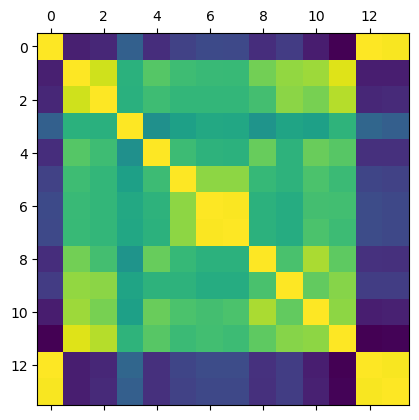

In [6]:
# Creating a correlation heatmap using matplotlib

plt.matshow(correlation)
plt.show()

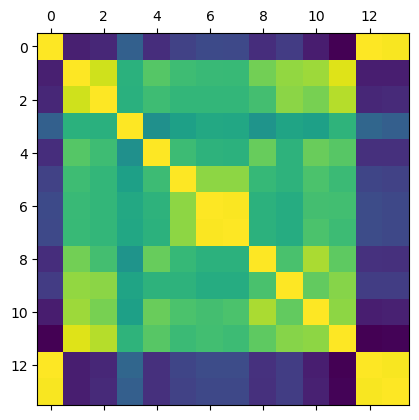

In [7]:
# Saving figure
plt.matshow(correlation)
plt.savefig(os.path.join(path, 'Visualizations', 'plt_heatmap.png'))

### Creating a correlation heatmap using seaborn:

In [8]:
df.columns

Index(['Unnamed: 0', '2026 Rank', 'Previous Rank', 'Institution Name',
       'Country/Territory', 'Region', 'Size', 'Focus', 'Research', 'Status',
       'Academic_Reputation_Score', 'Academic_Reputation_Rank',
       'Employer_Reputation_Score', 'Employer_Reputation_Rank',
       'Faculty_Student_Ratio_Score', 'Faculty_Student_Ratio_Rank',
       'Citations_Per_Faculty_Score', 'Citations_Per_Faculty_Rank',
       'International_Faculty_Ratio_Score', 'International_Faculty_Ratio_Rank',
       'International_Student_Ratio_Score', 'International_Student_Ratio_Rank',
       'International_Student_Diversity_Score',
       'International_Student_Diversity_Rank',
       'International_Research_Network_Score',
       'International_Research_Network_Rank', 'Employment_Outcomes_Score',
       'Employment_Outcomes_Rank', 'Sustainability_Score',
       'Sustainability_Rank', 'Overall SCORE', 'rank_range_midpoint',
       'prevrank_range_midpoint'],
      dtype='object')

In [9]:
# Creating a subset of the variables I want to look at more closely

sub = df[['rank_range_midpoint', 'prevrank_range_midpoint', 'Academic_Reputation_Score', 'Employer_Reputation_Score', 'Faculty_Student_Ratio_Score', 
       'Citations_Per_Faculty_Score', 'International_Faculty_Ratio_Score', 'International_Student_Ratio_Score', 'International_Student_Diversity_Score',
       'International_Research_Network_Score', 'Employment_Outcomes_Score', 'Sustainability_Score']]

In [10]:
sub

,rank_range_midpoint,prevrank_range_midpoint,Academic_Reputation_Score,Employer_Reputation_Score,Faculty_Student_Ratio_Score,Citations_Per_Faculty_Score,International_Faculty_Ratio_Score,International_Student_Ratio_Score,International_Student_Diversity_Score,International_Research_Network_Score,Employment_Outcomes_Score,Sustainability_Score
0,1.0,1.0,100.0,100.0,100.0,100.0,100.0,91.6,92.3,94.1,100.0,93.8
1,2.0,2.0,99.6,100.0,99.3,95.0,100.0,100.0,100.0,97.5,95.9,98.3
2,3.0,6.0,100.0,100.0,100.0,99.7,94.2,73.5,76.1,96.5,100.0,95.4
3,4.0,3.0,100.0,100.0,100.0,91.0,98.8,98.6,98.7,100.0,100.0,77.9
4,5.0,4.0,100.0,100.0,98.3,100.0,79.1,81.4,60.6,99.4,100.0,77.8
...,...,...,...,...,...,...,...,...,...,...,...,...
1496,NaN,1300.5,7.2,5.3,12.5,7.9,NaN,6.2,4.8,40.9,15.5,19.5
1497,NaN,1300.5,5.7,4.7,31.3,1.6,3.7,34.5,40.2,12.2,3.5,20.4
1498,NaN,NaN,8.3,2.7,12.5,5.6,13.9,3.0,7.4,31.5,3.2,43.0
1499,NaN,1300.5,4.4,2.9,46.1,8.2,8.0,4.5,8.9,15.4,1.7,22.5


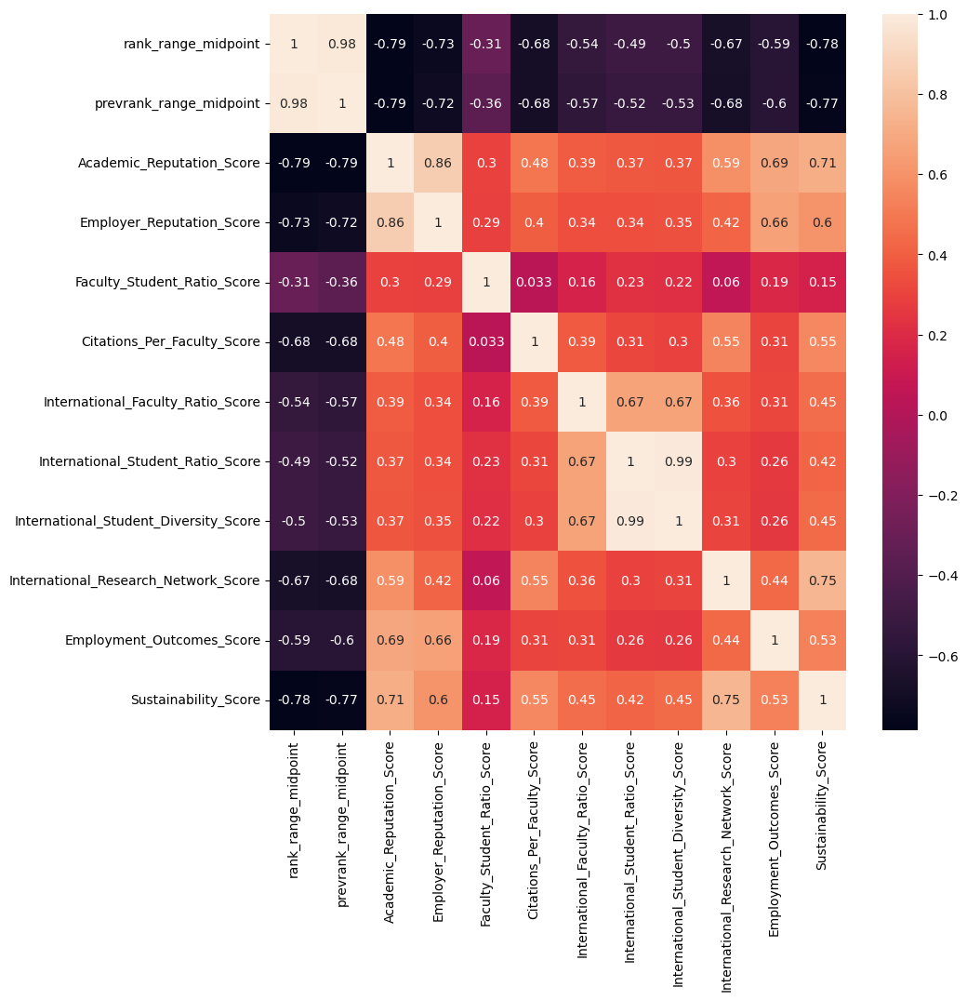

In [11]:
# Create a subplot with matplotlib
f,ax = plt.subplots(figsize=(10,10))

# Create the correlation heatmap in seaboarn by applying the heatmap onto the correlation matrix and the subplots defined above
corr = sns.heatmap(sub.corr(), annot = True, ax = ax)

# Saving image
plt.savefig(os.path.join(path, 'Visualizations', 'sns_heatmap.png'))

#### Looking at 'rank_range_midpoint' (my modified '2026 Rank') colomn as the dependent variable, we can see that all of the other 'score' variables have negative correlations with it. Meaning as any of those scores goes up, the rank goes down. It's important here to remember that we're ranking with #1 being "the best". 
##### For example, the strongest negative correlation is 'Academic_Repution_Score' at -0.79, and the weakest is 'Faculty_Student_Ratio_Score' at -0.31. 

### Scatterplots

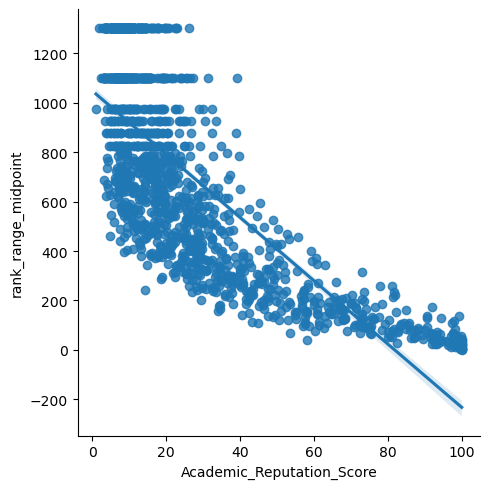

In [12]:
# Create a scatterplot for 'rank_range_midpoint' and 'Academic_Reputation_Score' in seaborn

sns.lmplot(x = 'Academic_Reputation_Score', y = 'rank_range_midpoint', data = df)

# Saving the image
plt.savefig(os.path.join(path, 'Visualizations', 'scatter_academic_rep.png'))

#### The scatterplot reflects the strong negative correlation between the two variables. The straight lines of points at the top would be reflective of multiple institutions sharing the same rank range, and there for rank range midpoint. 

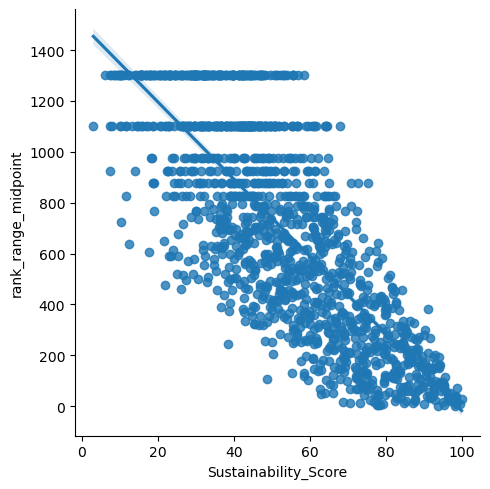

In [13]:
# Create a scatterplot for 'rank_range_midpoint' and 'Sustainablilty_Score' in seaborn

sns.lmplot(x = 'Sustainability_Score', y = 'rank_range_midpoint', data = df)

# Saving the image
plt.savefig(os.path.join(path, 'Visualizations', 'scatter_sus_score.png'))

#### This scatterplot also reflects the strong negative correlation between the 2 variables. 

### Pair Plots

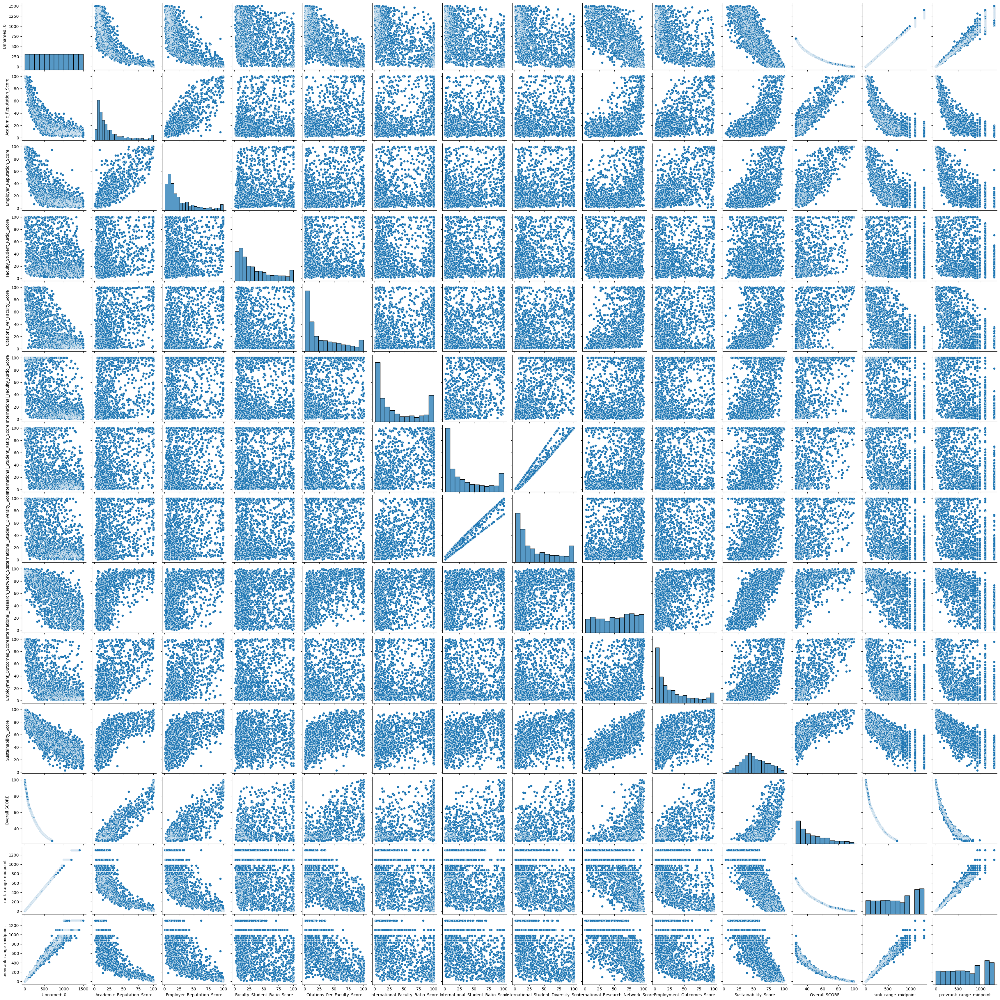

In [14]:
# Creating a pair plot of the entire data set

g = sns.pairplot(df) 

# Saving the image
plt.savefig(os.path.join(path, 'Visualizations', 'pairplot.png'))

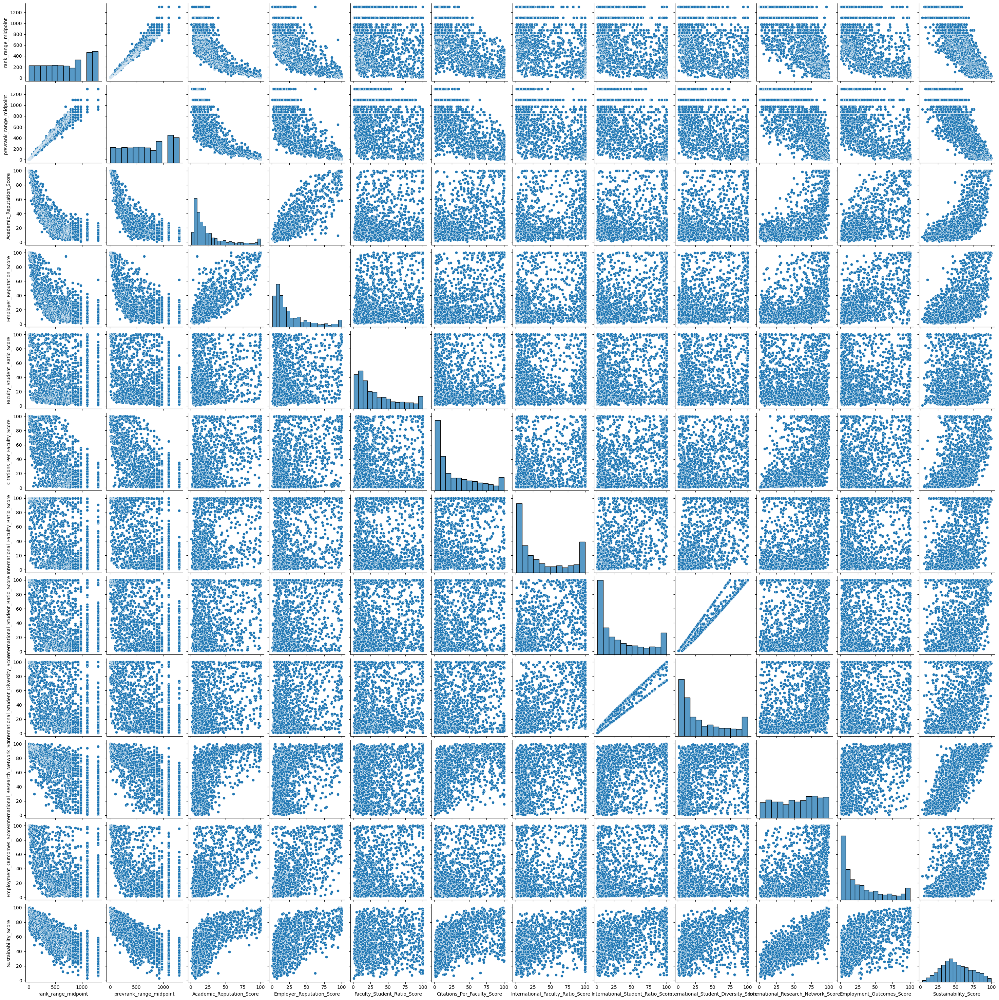

In [15]:
# Creating a pair plot of the subset

g = sns.pairplot(sub)

# Saving the image
plt.savefig(os.path.join(path, 'Visualizations', 'pairplot_subset.png'))

##### This is actually quite overwhelming to look at and try smaller subsets might be more useful further in my analytical process.

### Categorical Plots:

#### Since the ranking lends itself to easy categories, I don't find it necessary to create a histogram to determine categories. I'm going to focus this part of the analysis on the top 100 Universities. 

#### Creating categories

In [16]:
# Creating a subset for top 100

top_100_df = df[(df['rank_range_midpoint'] >= 1) & (df['rank_range_midpoint'] <= 100)].copy()

print(f"Original dataset size: {len(df)}")
print(f"Filtered dataset size (ranks 1-100): {len(top_100_df)}")

# Exporting subset
top_100_df.to_excel(os.path.join(path, 'Data', 'top_100_unis.xlsx'))

Original dataset size: 1501
Filtered dataset size (ranks 1-100): 100


In [17]:
# Categorize into categories

def categorize_rank(x):
    if pd.isna(x):
        return np.nan
    elif 1 <= x <= 25:
        return 'Top 25'
    elif 26 <= x <= 50:
        return '26-50'
    elif 51 <= x <= 75:
        return '51-75'
    else:  # 76-100
        return '76-100'

In [18]:
# Apply categorization to the filtered dataset

top_100_df['Rank Category'] = top_100_df['rank_range_midpoint'].apply(categorize_rank)

In [19]:
# Check the distribution of categories

rank_counts = top_100_df['Rank Category'].value_counts(dropna=False)
print("\nRank Category Distribution:")
print(rank_counts)


Rank Category Distribution:
Rank Category
Top 25    26
51-75     25
76-100    25
26-50     24
Name: count, dtype: int64


##### Confirmed that there are ties at some rankings (17, 22, 25, 32, 36, 38, 42, 47, 58, 63, 70, 72, 82, 88, 94, 98) within the top 100. A tie at 25 means there is no 26, which explains the uneven distribution between those 2 categories.

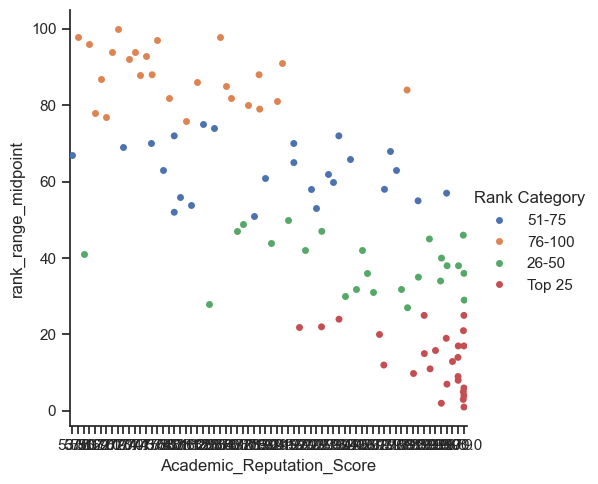

In [20]:
# Create a categorical plot in seaborn using the price categories created above

sns.set(style='ticks')
g = sns.catplot(x='Academic_Reputation_Score', y='rank_range_midpoint', hue='Rank Category', data=top_100_df)

# Saving image
g.savefig(os.path.join(path, 'Visualizations', 'catplot_academic_rep.png'))

#### This plot is more spread out than I anticipated, though the overall pattern is what I expected to see. Overall, the lower/best ranking schools are at the higher end of the spectrum of the Academic Reputation Scores. 

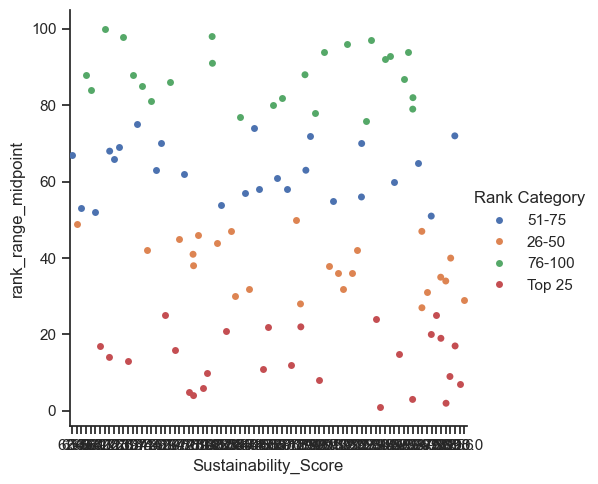

In [21]:
# Also creating one for Sustainability Score

sns.set(style='ticks')
g = sns.catplot(x='Sustainability_Score', y='rank_range_midpoint', hue='Rank Category', data=top_100_df)

# Saving image
g.savefig(os.path.join(path, 'Visualizations', 'catplot_sustainability.png'))

#### This is another spread-out plot, which does not surprise me, as sustainability is a more modern consideration.

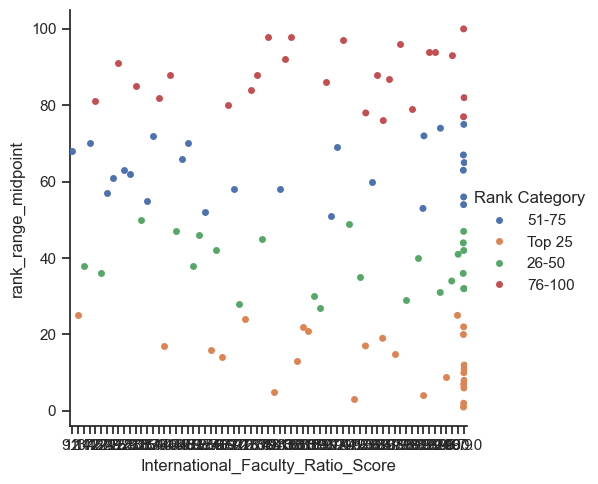

In [22]:
# To start to further answer one of my questions, I'd also like to look at international faculty ratio's correlation to rank

# Create a categorical plot in seaborn using the price categories created above

sns.set(style='ticks')
g = sns.catplot(x='International_Faculty_Ratio_Score', y='rank_range_midpoint', hue='Rank Category', data=top_100_df)

# Saving image
g.savefig(os.path.join(path, 'Visualizations', 'catplot_international_faculty.png'))

#### Again, pretty spread out, showing a concentration of the highest International Faculty Ratio Scores within the top 25 but also throughout the top 100 institutions. 

## Answering Questions: 

#### •	Do the presence of higher ratios of international faculty correlate with higher ranking?
Overall, there is a moderate-to-strong negative correlation between rank and higher international faculty ratio scores (-0.54). Within the top 100 institutions, there is a concentration of the highest International Faculty Ratio Scores within the top 25, but they are scattered throughout the top 100. 
#### •	Does better sustainability correlate with higher ranking?
Overall, there is a strong negative correlation between rank and higher sustainability scores (-0.78). The top 100 institutions are scattered throughout the spectrum of sustainability scores. 
#### •	Which one, three, and five factors have the strongest correlation to low (good) ranking?
Setting aside the previous year’s rank, the strongest correlations to 2026 Rank are:
1.	Academic Reputation Score (-0.79)
2.	Sustainability Score (-0.78)
3.	Employer Reputation Score (-0.73)
4.	Citations per Faculty Score (-0.68)
5.	International Research Network Score (-0.67)


## Adding Questions: 

#### •	Does the presence of higher ratios of international faculty and students have a more significant correlation with the ranking of institutions in different areas of the world? 
#### •	Does Sustainability Score have a more significant correlation with the ranking of institutions in different parts of the world? 


## Hypotheses: 

#### The institutions that rank the best will have high scores in all measures. 

##### Without having looked at categorical variables (like size and public/private), I hesitate to formulate any futher hypotheses at this time, as anything else is based on my own perspectives and would be biased.

In [23]:
# Creating and exporting smaller subsets for future use
top_50_df = df[(df['rank_range_midpoint'] >= 1) & (df['rank_range_midpoint'] <= 50)].copy()
top_50_df.to_excel(os.path.join(path, 'Data', 'top_50_unis.xlsx'))

top_10_df = df[(df['rank_range_midpoint'] >= 1) & (df['rank_range_midpoint'] <= 10)].copy()
top_10_df.to_excel(os.path.join(path, 'Data', 'top_10_unis.xlsx'))